## Lanenet - Inspect Trained Model

Code and visualizations to test, debug, and evaluate the lanenet model.

In [1]:
import os
import sys

import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import yaml
import logging
import logging.config
from easydict import EasyDict as edict

AI_CODE_BASE_PATH = '/codehub'
BASE_PATH_CONFIG = os.path.join(AI_CODE_BASE_PATH,'config')
APP_ROOT_DIR = os.path.join(AI_CODE_BASE_PATH,'apps')

if APP_ROOT_DIR not in sys.path:
  sys.path.insert(0, APP_ROOT_DIR)

import _cfg_
from falcon.arch import Model
import apputil
import viz
import common

from _log_ import logcfg
log = logging.getLogger(__name__)
logging.config.dictConfig(logcfg)

appcfg = _cfg_.load_appcfg(BASE_PATH_CONFIG)
appcfg = edict(appcfg)

import tensorflow as tf
from keras.backend import tensorflow_backend

%matplotlib inline 

2019-12-30 12:06:00,945:[DEBUG]:[__main__._cfg_]:[_cfg_.py:188 -          load_appcfg() ]: appcfg: {'PATHS': {'AI_ANNON_DATA_HOME': '/data/samba/Bangalore/prod/Bangalore_Maze_Exported_Data/ANNOTATIONS', 'AI_ANNON_DATA_HOME_LOCAL': '/aimldl-dat/data-gaze/AIML_Annotation/ods_merged_on_050719', 'AI_ANNON_DB': '/aimldl-dat/data-gaze/AIML_Database', 'AI_ANNON_HOME': '/codehub/apps/annon', 'AI_APP': '/codehub/apps', 'AI_CFG': '/codehub/cfg', 'AI_CONFIG': '/codehub/config', 'AI_DATA': '/aimldl-dat', 'AI_DOC': '/aimldl-doc', 'AI_GOOGLE_APPLICATION_CREDENTIALS': '/codehub/auth/', 'AI_HOME': '/codehub', 'AI_HOME_EXT': '/codehub/external', 'AI_KBANK': '/aimldl-kbank', 'AI_LANENET_ROOT': '/codehub/external/lanenet-lane-detection', 'AI_LOGS': '/aimldl-dat/logs', 'AI_MNT': '/aimldl-mnt', 'AI_MODEL_CFG_PATH': '/codehub/cfg/model', 'AI_PYVER': '3', 'AI_PY_ENVVARS': 'AI_APP:AI_HOME_EXT:MASK_RCNN:FASTER_RCNN:CAFFE_ROOT:AI_LANENET_ROOT', 'AI_PY_VENV_NAME': 'py_3-6-9_2019-12-19', 'AI_PY_VENV_PATH': '/code

Using TensorFlow backend.


## Notebook Preferences

In [2]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Utility Functions

In [3]:
def get_modelcfg(cfg, modelinfo_filepath):
    modelcfg = _cfg_.load_yaml(modelinfo_filepath)
    if type(modelcfg) != type([]):
        ## quick fix for name not present in config
        if modelcfg and modelcfg['config']:
            if 'name' in modelcfg:
                modelcfg['config']['NAME'] = modelcfg['name']
            if 'num_classes' in modelcfg:
                modelcfg['config']['NUM_CLASSES'] = modelcfg['num_classes']
            
            weights_path = apputil.get_abs_path(cfg, modelcfg, 'AI_WEIGHTS_PATH')
            modelcfg['weights_path'] = weights_path

    return modelcfg

def load_model(cfg, modelcfg):
    mode = modelcfg['mode']
    dnnarch = modelcfg['dnnarch']
    dnnmod = apputil.get_module(dnnarch)
    load_model_and_weights = apputil.get_module_fn(dnnmod, "load_model_and_weights")
    model = load_model_and_weights(mode, modelcfg, cfg)
    print("model: {}".format(model))
    return model


## Configuration Settings

In [4]:
HOST = "10.4.71.69"
AI_ANNON_DATA_HOME_LOCAL ="/aimldl-dat/data-gaze/AIML_Annotation/ods_job_230119"
API_MODEL_KEY = 'vidteq-rld-1'
DNN_NAME = 'lanenet'
LOG_DIR = 'api'
LOG_DIR = os.path.join(LOG_DIR, API_MODEL_KEY)
MODELINFO_FILEPATH = os.path.join('/codehub/cfg/model/release', API_MODEL_KEY+'-'+DNN_NAME+'.yml')

TIMESTAMP = common.timestamp()

# cmd = "train"
# dbname = "PXL-291119_180404"
# exp_id = "train-422d30b0-f518-4203-9c4d-b36bd8796c62"
# subset = "val"

# eval_on = subset

## Load Configurations

In [5]:
appcfg['APP']['DBCFG']['PXLCFG']['host'] = HOST
appcfg['PATHS']['AI_ANNON_DATA_HOME_LOCAL'] = AI_ANNON_DATA_HOME_LOCAL

# log.debug(appcfg)
# log.info(appcfg['APP']['DBCFG']['PXLCFG'])
# log.info(appcfg['PATHS']['AI_ANNON_DATA_HOME_LOCAL'])

modelcfg = get_modelcfg(appcfg, MODELINFO_FILEPATH)

## set the log and weights path
modelcfg['log_dir'] = LOG_DIR
log_dir_path = apputil.get_abs_path(appcfg, modelcfg, 'AI_LOGS')
weights_path = apputil.get_abs_path(appcfg, modelcfg, 'AI_WEIGHTS_PATH')
modelcfg['log_dir_path'] = log_dir_path
modelcfg['weights_path'] = weights_path

log.debug("modelcfg: {}".format(modelcfg))

print(weights_path)

model_filename = "model-{}-{}".format(DNN_NAME, TIMESTAMP)
model_filename = "model-{}-{}".format(DNN_NAME, "281219")
model_filepath_without_ext = os.path.join(os.path.dirname(weights_path), model_filename)
ckpt_model_filepath = os.path.join(os.path.dirname(weights_path), model_filename+'.ckpt')
# pb_model_filepath = os.path.join(os.path.dirname(weights_path), model_filename+'.pb')
tflite_model_filename = "tflite-{}-{}.{}".format(DNN_NAME, TIMESTAMP,'tflite')
tflite_model_filepath = os.path.join(os.path.dirname(weights_path), tflite_model_filename)


2019-12-30 12:06:13,116:[DEBUG]:[__main__]:[<ipython-input-5-1da3f848f99e>:17 -             <module>() ]: modelcfg: {'classes': ['BG', 'lane'], 'classinfo': None, 'config': None, 'dataset': 'lnd-291119_174355', 'dnnarch': 'lanenet', 'framework_type': 'tensorflow', 'id': 'rld', 'mode': 'inference', 'name': 'rld', 'num_classes': None, 'org_name': 'vidteq', 'problem_id': 'rld', 'rel_num': 1, 'weights': None, 'weights_path': '/aimldl-dat/release/vidteq/rld/1/lanenet/weights/vidteq-rld-1.pb', 'log_dir': 'api/vidteq-rld-1', 'log_dir_path': '/aimldl-dat/logs/api/vidteq-rld-1'}
/aimldl-dat/release/vidteq/rld/1/lanenet/weights/vidteq-rld-1.pb


## Load Model

In [6]:
model = load_model(appcfg, modelcfg)

2019-12-30 12:06:15,827:[INFO]:[__main__.falcon.arch.lanenet]:[lanenet.py:73 - load_model_and_weights() ]: load_model_and_weights:----------------------------->
2019-12-30 12:06:15,827:[INFO]:[__main__.falcon.arch.lanenet]:[lanenet.py:77 - load_model_and_weights() ]: device: /gpu:0
2019-12-30 12:06:15,828:[INFO]:[__main__.falcon.arch.lanenet]:[lanenet.py:78 - load_model_and_weights() ]: dnncfg: None
2019-12-30 12:06:15,828:[DEBUG]:[__main__.falcon.arch.lanenet]:[lanenet.py:111 - load_model_and_weights() ]: Loading weights from weights_path: /aimldl-dat/release/vidteq/rld/1/lanenet/weights/vidteq-rld-1.pb
model: <tensorflow.python.framework.ops.Graph object at 0x7fa85980d518>


In [8]:
help(model)

Help on Graph in module tensorflow.python.framework.ops object:

class Graph(builtins.object)
 |  A TensorFlow computation, represented as a dataflow graph.
 |  
 |  A `Graph` contains a set of
 |  `tf.Operation` objects,
 |  which represent units of computation; and
 |  `tf.Tensor` objects, which represent
 |  the units of data that flow between operations.
 |  
 |  A default `Graph` is always registered, and accessible by calling
 |  `tf.compat.v1.get_default_graph`.
 |  To add an operation to the default graph, simply call one of the functions
 |  that defines a new `Operation`:
 |  
 |  ```python
 |  c = tf.constant(4.0)
 |  assert c.graph is tf.compat.v1.get_default_graph()
 |  ```
 |  
 |  Another typical usage involves the
 |  `tf.Graph.as_default`
 |  context manager, which overrides the current default graph for the
 |  lifetime of the context:
 |  
 |  ```python
 |  g = tf.Graph()
 |  with g.as_default():
 |    # Define operations and tensors in `g`.
 |    c = tf.constant(30.

In [ ]:
## Convert h5 to ckpt
sess = tensorflow_backend.get_session()

# print(model.output.op.name)
saver = tf.train.Saver()
saver.save(sess, ckpt_model_filepath)

In [9]:
model.get_operations()

[<tf.Operation 'lanenet/input_tensor' type=Placeholder>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/conv/W' type=Const>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/conv/W/read' type=Identity>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/conv/Conv2D' type=Conv2D>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/conv/conv' type=Identity>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/bn/gamma' type=Const>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/bn/gamma/read' type=Identity>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/bn/beta' type=Const>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/bn/beta/read' type=Identity>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/conv1_1/bn/moving_mean' type=Const>,
 <tf.Operation 'lanenet_model/vgg_frontend/vgg16_encode_module/co

In [20]:
pb_model_filepath = weights_path
tf.lite.TFLiteConverter?


In [24]:

converter = tf.compat.v1.lite.TFLiteConverter.from_frozen_graph(
    pb_model_filepath
    ,input_arrays=['lanenet/input_tensor']
    ,output_arrays=['lanenet/final_binary_output','lanenet/final_pixel_embedding_output']
    ,input_shapes={
        "lanenet/input_tensor": [1,256,512,3]
    }
)


In [25]:
tflite_model = converter.convert()

In [26]:
tflite_model_filepath

'/aimldl-dat/release/vidteq/rld/1/lanenet/weights/tflite-lanenet-301219_120608.tflite'

In [28]:
with open(tflite_model_filepath,'wb') as fwb:
    fwb.write(tflite_model)

In [30]:
interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

RuntimeError: tensorflow/lite/kernels/reshape.cc:66 num_input_elements != num_output_elements (131072 != 262144)Node number 73 (RESHAPE) failed to prepare.


In [19]:
## https://stackoverflow.com/questions/45466020/how-to-export-keras-h5-to-tensorflow-pb
## https://github.com/tensorflow/tensorflow/blob/v1.12.0/tensorflow/python/tools/freeze_graph.py

def freeze_session(session, keep_var_names=None, output_names=None, clear_devices=True):
    """
    Freezes the state of a session into a pruned computation graph.

    Creates a new computation graph where variable nodes are replaced by
    constants taking their current value in the session. The new graph will be
    pruned so subgraphs that are not necessary to compute the requested
    outputs are removed.
    @param session The TensorFlow session to be frozen.
    @param keep_var_names A list of variable names that should not be frozen,
                          or None to freeze all the variables in the graph.
    @param output_names Names of the relevant graph outputs.
    @param clear_devices Remove the device directives from the graph for better portability.
    @return The frozen graph definition.
    """
    graph = session.graph
    with graph.as_default():
        freeze_var_names = list(set(v.op.name for v in tf.global_variables()).difference(keep_var_names or []))
        output_names = output_names or []
        output_names += [v.op.name for v in tf.global_variables()]
        input_graph_def = graph.as_graph_def()
        if clear_devices:
            for node in input_graph_def.node:
                node.device = ""
        frozen_graph = tf.graph_util.convert_variables_to_constants(
            session, input_graph_def, output_names, freeze_var_names)
        return frozen_graph

In [21]:
frozen_graph = freeze_session(sess, output_names=[out.op.name for out in model.keras_model.outputs])

Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants
2019-12-24 18:57:57,917:[WARNING]:[tensorflow]:[deprecation.py:323 -             new_func() ]: From <ipython-input-19-0fee9059a186>:29: convert_variables_to_constants (from tensorflow.python.framework.graph_util_impl) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants
Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph
2019-12-24 18:57:57,919:[WARNING]:[tensorflow]:[deprecation.py:323 -             new_func() ]: From /codehub/virtualmachines/virtualenvs/py_3-6-9_2019-12-18/lib/python3.6/site-packages/tensorflow/python/framework/graph_util_impl.py:245: extract_sub_graph (from tensorflow.python.framework.graph_util_impl) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph
INFO:tensorflow:Froze 690 variables.
2019-12-24 

In [23]:
## save to protocol buffer file format
tf.train.write_graph(frozen_graph, os.path.dirname(weights_path), model_filename+'.pb', as_text=False)

'/aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219.pb'

In [19]:
# pb_model_filepath = '/aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219.pb'
pb_model_filepath = os.path.join(os.path.dirname(weights_path), model_filename+'.pb')
print("pb_model_filepath: {}".format(pb_model_filepath))

sess = tensorflow_backend.get_session()

with tf.gfile.GFile(pb_model_filepath, "rb") as f:
    graph_def = tf.GraphDef()
    graph_def.ParseFromString(f.read())
#     sess.graph.as_default()
#     g_in = tf.import_graph_def(graph_def)

with tf.Graph().as_default() as graph:
    tf.import_graph_def(graph_def, name="")


pb_model_filepath: /aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219.pb


In [27]:
## https://medium.com/@rudolas/how-to-convert-pb-model-to-tensorflow-lite-without-local-linux-machine-72efc1e30de9

pb_model_filepath="/aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219.pb"
tflite_model_filepath="/aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219.pb.tflite"

converter = tf.lite.TFLiteConverter.from_frozen_graph(
    pb_model_filepath
    ,input_arrays=['input_image','input_image_meta','input_anchors']
    ,output_arrays=['mrcnn_detection/Reshape_1','mrcnn_class/Reshape_1','mrcnn_bbox/Reshape','mrcnn_mask/Reshape_1','mrcnn_mask/Reshape_1','ROI/packed_2','rpn_class/concat','rpn_class/concat','rpn_bbox/concat']
    ,input_shapes={
        "input_image": [1, 1280, 1280, 3]
        ,"input_image_meta":[1, 16]
        ,"input_anchors":[1, 64, 4]
    }
)
tflite_model = converter.convert()

# with open(tflite_model_filepath,’wb’) as fwb:
#     fwb.write(tflite_model)

ConverterError: TOCO failed. See console for info.
2019-12-26 15:54:52.211674: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: NonMaxSuppressionV3
2019-12-26 15:54:52.219701: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Round
2019-12-26 15:54:52.219766: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.219776: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.219814: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.219844: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.219924: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.219967: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.219978: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.219986: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.220038: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.220050: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.220057: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.220092: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.246868: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.246925: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.247102: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.247146: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.247184: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: DenseToDenseSetOperation
2019-12-26 15:54:52.247244: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Unique
2019-12-26 15:54:52.247299: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayV3
2019-12-26 15:54:52.247312: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-26 15:54:52.247337: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayScatterV3
2019-12-26 15:54:52.247382: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayV3
2019-12-26 15:54:52.247389: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-26 15:54:52.247398: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247407: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247414: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247456: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247466: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: LoopCond
2019-12-26 15:54:52.247488: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247507: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-26 15:54:52.247512: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247537: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayReadV3
2019-12-26 15:54:52.247544: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247553: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.247573: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247587: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247605: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: NonMaxSuppressionV3
2019-12-26 15:54:52.247620: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247658: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-26 15:54:52.247666: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-26 15:54:52.247673: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayWriteV3
2019-12-26 15:54:52.247688: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Exit
2019-12-26 15:54:52.247696: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArraySizeV3
2019-12-26 15:54:52.247713: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayGatherV3
2019-12-26 15:54:52.247731: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.247759: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: DenseToDenseSetOperation
2019-12-26 15:54:52.247936: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Round
2019-12-26 15:54:52.247967: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.247976: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.248001: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.248013: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.248020: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.248044: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.248070: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.248077: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.248101: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.248113: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-26 15:54:52.248120: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-26 15:54:52.248144: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-26 15:54:52.333848: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before Removing unused ops: 2203 operators, 3566 arrays (0 quantized)
2019-12-26 15:54:52.407001: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before general graph transformations: 2203 operators, 3566 arrays (0 quantized)
2019-12-26 15:54:52.911310: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 1: 626 operators, 1338 arrays (0 quantized)
2019-12-26 15:54:52.932715: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 2: 618 operators, 1330 arrays (0 quantized)
2019-12-26 15:54:52.952621: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 3: 616 operators, 1326 arrays (0 quantized)
2019-12-26 15:54:52.977334: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before dequantization graph transformations: 616 operators, 1326 arrays (0 quantized)
2019-12-26 15:54:53.013201: F tensorflow/lite/toco/tooling_util.cc:627] Check failed: dim >= 1 (0 vs. 1)
Aborted (core dumped)




In [28]:
help(tf.lite.TFLiteConverter.from_frozen_graph)

Help on method from_frozen_graph in module tensorflow.lite.python.lite:

from_frozen_graph(graph_def_file, input_arrays, output_arrays, input_shapes=None) method of builtins.type instance
    Creates a TFLiteConverter class from a file containing a frozen GraphDef.
    
    Args:
      graph_def_file: Full filepath of file containing frozen GraphDef.
      input_arrays: List of input tensors to freeze graph with.
      output_arrays: List of output tensors to freeze graph with.
      input_shapes: Dict of strings representing input tensor names to list of
        integers representing input shapes (e.g., {"foo" : [1, 16, 16, 3]}).
        Automatically determined when input shapes is None (e.g., {"foo" :
          None}). (default None)
    
    Returns:
      TFLiteConverter class.
    
    Raises:
      IOError:
        File not found.
        Unable to parse input file.
      ValueError:
        The graph is not frozen.
        input_arrays or output_arrays contains an invalid tenso

In [35]:
for op in sess.graph.get_operations():
    print(op)

name: "input_image"
op: "Placeholder"
device: "/device:GPU:0"
attr {
  key: "dtype"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "shape"
  value {
    shape {
      dim {
        size: -1
      }
      dim {
        size: -1
      }
      dim {
        size: -1
      }
      dim {
        size: 3
      }
    }
  }
}

name: "input_image_meta"
op: "Placeholder"
device: "/device:GPU:0"
attr {
  key: "dtype"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "shape"
  value {
    shape {
      dim {
        size: -1
      }
      dim {
        size: 16
      }
    }
  }
}

name: "input_anchors"
op: "Placeholder"
device: "/device:GPU:0"
attr {
  key: "dtype"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "shape"
  value {
    shape {
      dim {
        size: -1
      }
      dim {
        size: -1
      }
      dim {
        size: 4
      }
    }
  }
}

name: "zero_padding2d_1/Pad/paddings"
op: "Const"
device: "/device:GPU:0"
attr {
  key: "dtype"
  value {
    type: DT_INT32
  }
}
att

name: "bn4h_branch2c/beta/Assign"
op: "Assign"
input: "bn4h_branch2c/beta"
input: "bn4h_branch2c/Const_1"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "_class"
  value {
    list {
      s: "loc:@bn4h_branch2c/beta"
    }
  }
}
attr {
  key: "use_locking"
  value {
    b: true
  }
}
attr {
  key: "validate_shape"
  value {
    b: true
  }
}

name: "bn4h_branch2c/beta/read"
op: "Identity"
input: "bn4h_branch2c/beta"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "_class"
  value {
    list {
      s: "loc:@bn4h_branch2c/beta"
    }
  }
}

name: "bn4h_branch2c/Const_2"
op: "Const"
device: "/device:GPU:0"
attr {
  key: "dtype"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "value"
  value {
    tensor {
      dtype: DT_FLOAT
      tensor_shape {
        dim {
          size: 1024
        }
      }
      float_val: 0.0
    }
  }
}

name: "bn4h_branch2c/moving_mean"
op: "VariableV2"
device: "/device:

name: "bn5b_branch2b/moving_mean"
op: "VariableV2"
device: "/device:GPU:0"
attr {
  key: "container"
  value {
    s: ""
  }
}
attr {
  key: "dtype"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "shape"
  value {
    shape {
      dim {
        size: 512
      }
    }
  }
}
attr {
  key: "shared_name"
  value {
    s: ""
  }
}

name: "bn5b_branch2b/moving_mean/Assign"
op: "Assign"
input: "bn5b_branch2b/moving_mean"
input: "bn5b_branch2b/Const_2"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "_class"
  value {
    list {
      s: "loc:@bn5b_branch2b/moving_mean"
    }
  }
}
attr {
  key: "use_locking"
  value {
    b: true
  }
}
attr {
  key: "validate_shape"
  value {
    b: true
  }
}

name: "bn5b_branch2b/moving_mean/read"
op: "Identity"
input: "bn5b_branch2b/moving_mean"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}
attr {
  key: "_class"
  value {
    list {
      s: "loc:@bn5b_branch2b/moving_mean"
    

name: "mrcnn_detection/map/while/NextIteration_1"
op: "NextIteration"
input: "mrcnn_detection/map/while/add_1"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_INT32
  }
}

name: "mrcnn_detection/map/while/NextIteration_2"
op: "NextIteration"
input: "mrcnn_detection/map/while/TensorArrayWrite/TensorArrayWriteV3"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}

name: "mrcnn_detection/map/while/Exit"
op: "Exit"
input: "mrcnn_detection/map/while/Switch"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_INT32
  }
}

name: "mrcnn_detection/map/while/Exit_1"
op: "Exit"
input: "mrcnn_detection/map/while/Switch_1"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_INT32
  }
}

name: "mrcnn_detection/map/while/Exit_2"
op: "Exit"
input: "mrcnn_detection/map/while/Switch_2"
device: "/device:GPU:0"
attr {
  key: "T"
  value {
    type: DT_FLOAT
  }
}

name: "mrcnn_detection/map/TensorArrayStack/TensorArraySizeV3"
op: "Tensor

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [41]:
in_tensors = model.keras_model.inputs
out_tensors = model.keras_model.outputs

In [42]:
in_tensors

[<tf.Tensor 'input_image:0' shape=(?, ?, ?, 3) dtype=float32>,
 <tf.Tensor 'input_image_meta:0' shape=(?, 16) dtype=float32>,
 <tf.Tensor 'input_anchors:0' shape=(?, ?, 4) dtype=float32>]

In [43]:
out_tensors

[<tf.Tensor 'mrcnn_detection/Reshape_1:0' shape=(1, 100, 6) dtype=float32>,
 <tf.Tensor 'mrcnn_class/Reshape_1:0' shape=(?, 1000, 4) dtype=float32>,
 <tf.Tensor 'mrcnn_bbox/Reshape:0' shape=(?, 1000, 4, 4) dtype=float32>,
 <tf.Tensor 'mrcnn_mask/Reshape_1:0' shape=(1, 100, 28, 28, 4) dtype=float32>,
 <tf.Tensor 'ROI/packed_2:0' shape=(1, ?, 4) dtype=float32>,
 <tf.Tensor 'rpn_class/concat:0' shape=(?, ?, 2) dtype=float32>,
 <tf.Tensor 'rpn_bbox/concat:0' shape=(?, ?, 4) dtype=float32>]

In [44]:
input_image = sess.graph.get_tensor_by_name('input_image:0')
input_image_meta = sess.graph.get_tensor_by_name('input_image_meta:0')
input_anchors = sess.graph.get_tensor_by_name('input_anchors:0')

mrcnn_detection = sess.graph.get_tensor_by_name('mrcnn_detection/Reshape_1:0')
mrcnn_class = sess.graph.get_tensor_by_name('mrcnn_class/Reshape_1:0')
mrcnn_bbox = sess.graph.get_tensor_by_name('mrcnn_bbox/Reshape:0')
mrcnn_mask = sess.graph.get_tensor_by_name('mrcnn_mask/Reshape_1:0')
roi_packed = sess.graph.get_tensor_by_name('ROI/packed_2:0')
rpn_class = sess.graph.get_tensor_by_name('rpn_class/concat:0')
rpn_bbox = sess.graph.get_tensor_by_name('rpn_bbox/concat:0')

In [ ]:
im = None
sess.run(
  [input_image, input_image_meta, input_anchors],
  feed_dict={input_tensor: [im]}
)

In [24]:
# import cv2 as cv
# model_pb = cv.dnn.readNetFromTensorflow(pb_model_filepath)

error: OpenCV(4.1.2) /io/opencv/modules/dnn/src/tensorflow/tf_importer.cpp:544: error: (-2:Unspecified error) Input layer not found: mrcnn_mask_deconv/Shape in function 'connect'


In [42]:
print("model_filepath_without_ext: {}".format(model_filepath_without_ext))
print("tflite_model_filepath: {}".format(tflite_model_filepath))

model_filepath_without_ext: /aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/model-mask_rcnn-241219
tflite_model_filepath: /aimldl-dat/release/vidteq/ods/7/mask_rcnn/weights/tflite-mask_rcnn-241219_165413.tflite


In [43]:
## serialize model to JSON
## https://machinelearningmastery.com/save-load-keras-deep-learning-models/

model_json = model.keras_model.to_json()
with open(os.path.join(model_filepath_without_ext+'.json'), 'w') as fw:
    fw.write(model_json)

model_yml = model.keras_model.to_yaml()
with open(os.path.join(model_filepath_without_ext+'.yml'), 'w') as fw:
    fw.write(model_yml)

In [74]:
tf.keras.backend.clear_session()  # For easy reset of notebook state.
sess = tensorflow_backend.get_session()

in_tensors = model.keras_model.inputs
out_tensors = model.keras_model.outputs

print("in_tensors: {}".format(in_tensors))
print("out_tensors: {}".format(out_tensors))

in_tensors: [<tf.Tensor 'input_image_4:0' shape=(1, 720, 1280, 3) dtype=float32>, <tf.Tensor 'input_image_meta:0' shape=(1, 16) dtype=float32>, <tf.Tensor 'input_anchors_3:0' shape=(?, 256, 4) dtype=float32>]
out_tensors: [<tf.Tensor 'mrcnn_detection/Reshape_1:0' shape=(1, 100, 6) dtype=float32>, <tf.Tensor 'mrcnn_class/Reshape_1:0' shape=(?, 1000, 4) dtype=float32>, <tf.Tensor 'mrcnn_bbox/Reshape:0' shape=(?, 1000, 4, 4) dtype=float32>, <tf.Tensor 'mrcnn_mask/Reshape_1:0' shape=(1, 100, 28, 28, 4) dtype=float32>, <tf.Tensor 'ROI/packed_2:0' shape=(1, ?, 4) dtype=float32>, <tf.Tensor 'rpn_class/concat:0' shape=(?, ?, 2) dtype=float32>, <tf.Tensor 'rpn_bbox/concat:0' shape=(?, ?, 4) dtype=float32>]


In [45]:
## throws error: ValueError: No model found in config file.
# converter = tf.lite.TFLiteConverter.from_keras_model_file(weights_path)

ValueError: No model found in config file.

In [98]:
tf.keras.backend.clear_session()  # For easy reset of notebook state.

In [99]:
import keras.layers as KL
input_image = KL.Input(shape=[1280, 1280, 3], name="input_image")
print(input_image)
in_tensors[0] = input_image

Tensor("input_image:0", shape=(?, 1280, 1280, 3), dtype=float32)


In [100]:
input_anchors = KL.Input(shape=[64, 4], name="input_anchors")
print(input_anchors)
in_tensors[2] = input_anchors

Tensor("input_anchors:0", shape=(?, 64, 4), dtype=float32)


In [101]:
in_tensors

[<tf.Tensor 'input_image:0' shape=(?, 1280, 1280, 3) dtype=float32>,
 <tf.Tensor 'input_image_meta:0' shape=(1, 16) dtype=float32>,
 <tf.Tensor 'input_anchors:0' shape=(?, 64, 4) dtype=float32>]

In [40]:
out_tensors

[<tf.Tensor 'mrcnn_detection/Reshape_1:0' shape=(1, 100, 6) dtype=float32>,
 <tf.Tensor 'mrcnn_class/Reshape_1:0' shape=(?, 1000, 4) dtype=float32>,
 <tf.Tensor 'mrcnn_bbox/Reshape:0' shape=(?, 1000, 4, 4) dtype=float32>,
 <tf.Tensor 'mrcnn_mask/Reshape_1:0' shape=(1, 100, 28, 28, 4) dtype=float32>,
 <tf.Tensor 'ROI/packed_2:0' shape=(1, ?, 4) dtype=float32>,
 <tf.Tensor 'rpn_class/concat:0' shape=(?, ?, 2) dtype=float32>,
 <tf.Tensor 'rpn_bbox/concat:0' shape=(?, ?, 4) dtype=float32>]

In [103]:
converter = tf.lite.TFLiteConverter.from_session(sess, in_tensors, out_tensors)
converter.allow_custom_ops=True



INFO:tensorflow:Froze 690 variables.
2019-12-24 17:34:23,025:[INFO]:[tensorflow]:[graph_util_impl.py:268 - convert_variables_to_constants() ]: Froze 690 variables.
INFO:tensorflow:Converted 690 variables to const ops.
2019-12-24 17:34:23,354:[INFO]:[tensorflow]:[graph_util_impl.py:301 - convert_variables_to_constants() ]: Converted 690 variables to const ops.


In [104]:
tflite_model = converter.convert()

ConverterError: TOCO failed. See console for info.
2019-12-24 17:34:30.338664: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: NonMaxSuppressionV3
2019-12-24 17:34:30.347126: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Round
2019-12-24 17:34:30.347261: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.347271: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.347315: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.347361: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.347369: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.347442: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.347456: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.347464: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.347489: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.347502: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.347510: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.347548: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.376642: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.376740: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.377144: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.377227: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.377296: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: DenseToDenseSetOperation
2019-12-24 17:34:30.377385: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Unique
2019-12-24 17:34:30.377460: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayV3
2019-12-24 17:34:30.377471: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-24 17:34:30.377540: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayScatterV3
2019-12-24 17:34:30.377574: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayV3
2019-12-24 17:34:30.377582: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-24 17:34:30.377617: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377630: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377646: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377693: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377724: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: LoopCond
2019-12-24 17:34:30.377759: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayReadV3
2019-12-24 17:34:30.377791: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377799: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-24 17:34:30.377818: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377828: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377855: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.377881: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377896: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.377914: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: NonMaxSuppressionV3
2019-12-24 17:34:30.377934: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.378013: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayWriteV3
2019-12-24 17:34:30.378025: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Enter
2019-12-24 17:34:30.378033: I tensorflow/lite/toco/import_tensorflow.cc:193] Unsupported data type in placeholder op: 20
2019-12-24 17:34:30.378048: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Exit
2019-12-24 17:34:30.378057: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArraySizeV3
2019-12-24 17:34:30.378091: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: TensorArrayGatherV3
2019-12-24 17:34:30.378127: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.378161: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: DenseToDenseSetOperation
2019-12-24 17:34:30.378450: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Round
2019-12-24 17:34:30.378508: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.378520: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.378549: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.378563: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.378572: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.378630: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.378644: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.378653: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.378679: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.378693: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: Where
2019-12-24 17:34:30.378702: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: GatherNd
2019-12-24 17:34:30.378740: I tensorflow/lite/toco/import_tensorflow.cc:1324] Converting unsupported operation: CropAndResize
2019-12-24 17:34:30.469781: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before Removing unused ops: 2203 operators, 3566 arrays (0 quantized)
2019-12-24 17:34:30.548172: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before general graph transformations: 2203 operators, 3566 arrays (0 quantized)
2019-12-24 17:34:31.058848: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 1: 626 operators, 1338 arrays (0 quantized)
2019-12-24 17:34:31.078255: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 2: 618 operators, 1330 arrays (0 quantized)
2019-12-24 17:34:31.098977: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] After general graph transformations pass 3: 616 operators, 1326 arrays (0 quantized)
2019-12-24 17:34:31.122749: I tensorflow/lite/toco/graph_transformations/graph_transformations.cc:39] Before dequantization graph transformations: 616 operators, 1326 arrays (0 quantized)
2019-12-24 17:34:31.157273: F tensorflow/lite/toco/tooling_util.cc:627] Check failed: dim >= 1 (0 vs. 1)
Aborted (core dumped)




In [ ]:
# open(tflite_model_filepath, "wb").write(tflite_model)
with open(tflite_model_filepath, "wb") as fwb:
    fwb.write(tflite_model)

## Load Validation Dataset

In [14]:
dataset, num_classes, num_images, class_names, total_stats, total_verify = apputil.get_dataset_instance(appcfg, dbcfg, datacfg, subset)
colors = viz.random_colors(len(class_names))

log.debug("class_names: {}".format(class_names))
log.debug("len(class_names): {}".format(len(class_names)))
log.debug("len(colors), colors: {},{}".format(len(colors), colors))
log.debug("num_classes: {}".format(num_classes))
log.debug("num_images: {}".format(num_images))

name = dataset.name
datacfg.name = name
datacfg.classes = class_names
datacfg.num_classes = num_classes

cmdcfg.name = name
cmdcfg.config.NAME = name
cmdcfg.config.NUM_CLASSES = num_classes

2019-12-23 15:05:26,318:[INFO]:[__main__.apputil]:[apputil.py:198 - get_dataset_instance() ]: -------------------------------->
2019-12-23 15:05:26,320:[DEBUG]:[__main__.apputil]:[apputil.py:199 - get_dataset_instance() ]: datacfg: {'created_on': '2019-11-29 18:04:13 +05:30', 'allowed_file_type': ['.txt', '.csv', '.yml', '.json'], 'allowed_image_type': ['.pdf', '.png', '.jpg', '.jpeg', '.gif'], 'allowed_video_type': ['.mp4'], 'annon_type': 'hmd', 'config': {'DETECTION_MIN_CONFIDENCE': 0.9, 'GPU_COUNT': 1, 'IMAGES_PER_GPU': 1, 'IMAGE_MAX_DIM': 1280, 'IMAGE_MIN_DIM': 720, 'STEPS_PER_EPOCH': 1000}, 'creator': 'AIE1', 'dataclass': 'AnnonDataset', 'dbname': 'PXL-291119_180404', 'device': '/gpu:0', 'dnnarch': 'mask_rcnn', 'filename': '281119_123250-AIE1-21-mask_rcnn.yml', 'filepath': '/aimldl-cfg/arch/281119_123250-AIE1-21-mask_rcnn.yml', 'framework_type': 'keras', 'load_weights': {'by_name': True, 'exclude': ['mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask']}, 'log_dir': 'm

2019-12-23 15:05:26,455:[INFO]:[__main__.annon.dataset.Annon]:[Annon.py:121 -    load_data_from_db() ]: classinfo: [{'lbl_id': 'signage', 'name': 'signage', 'source': 'hmd'}, {'lbl_id': 'traffic_light', 'name': 'traffic_light', 'source': 'hmd'}, {'lbl_id': 'traffic_sign', 'name': 'traffic_sign', 'source': 'hmd'}]
2019-12-23 15:05:26,457:[INFO]:[__main__.annon.dataset.Annon]:[Annon.py:130 -    load_data_from_db() ]: len(release): 0
2019-12-23 15:05:26,458:[INFO]:[__main__.annon.dataset.Annon]:[Annon.py:168 -          createIndex() ]: -------------------------------->
2019-12-23 15:05:26,463:[INFO]:[__main__.annon.dataset.Annon]:[Annon.py:196 -          createIndex() ]: index created!
2019-12-23 15:05:26,464:[INFO]:[__main__.annon.dataset.Annon]:[Annon.py:55 -             __init__() ]: Done (t=0.14s)
2019-12-23 15:05:26,465:[DEBUG]:[__main__.utils.AnnonDataset]:[AnnonDataset.py:370 -             load_hmd() ]: subset, class_ids: val, ['signage', 'traffic_light', 'traffic_sign']
2019-12-23

2019-12-23 15:05:26,730:[INFO]:[__main__.falcon.arch.mask_rcnn]:[mask_rcnn.py:71 -           get_dnncfg() ]: For Image: WxH=1920x1080 and AP=1.78, re-sized h,w can be: [{'w': 320, 'h': 192, 'ap': 1.67}, {'w': 448, 'h': 256, 'ap': 1.75}, {'w': 576, 'h': 320, 'ap': 1.8}, {'w': 640, 'h': 384, 'ap': 1.67}, {'w': 704, 'h': 384, 'ap': 1.83}, {'w': 768, 'h': 448, 'ap': 1.71}, {'w': 896, 'h': 512, 'ap': 1.75}, {'w': 960, 'h': 576, 'ap': 1.67}, {'w': 1024, 'h': 576, 'ap': 1.78}]


## Run Detection

image ID: hmd.hmd-img-191ce568-a8c3-4026-98c0-cdaa2a59b1f4 (97) /aimldl-dat/data-gaze/AIML_Annotation/ods_job_230119/images/images-p2-050219_AT3/291018_105555_16717_zed_l_101.jpg
Processing 1 images
image                    shape: (1280, 1280, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1280.00000  int64
anchors                  shape: (1, 409200, 4)        min:   -0.28306  max:    1.23302  float32
1/1 [==============================] - 3s 3s/step
2019-12-23 15:06:33,770:[DEBUG]:[__main__.mrcnn.model]:[model.py:2654 -               detect() ]: results: [{'rois': array([[600, 443, 613, 452],
       [614, 539, 630, 549]], dtype=int32), 'class_ids': array([1, 3], dtype=int32), 'scores': array([0.97616196, 0.93794125], dtype=float32), 'masks': array([[[False, False],
        [False, False],
        [False, False],
 

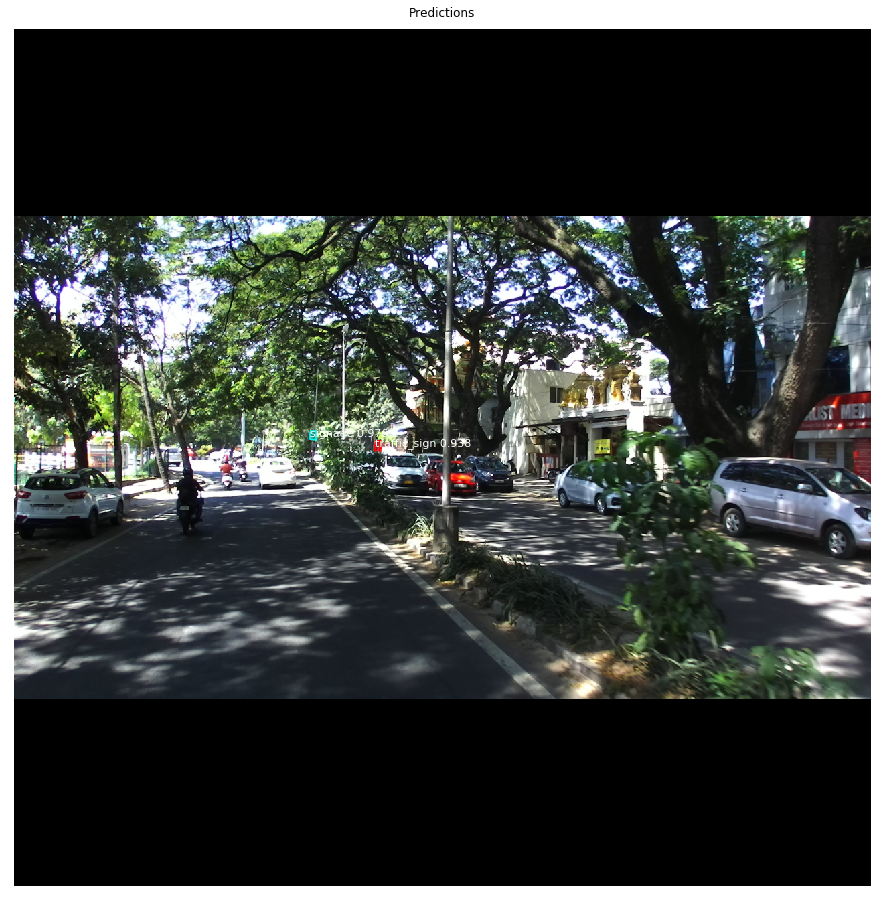

In [18]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, datacfg, dnncfg, image_id, use_mini_mask=False)

info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
# log("gt_class_id", gt_class_id)
# log("gt_bbox", gt_bbox)
# log("gt_mask", gt_mask)

### Precision-Recall

2019-12-23 15:06:40,529:[INFO]:[__main__.mrcnn.utils]:[utils.py:680 -      compute_matches() ]: sorted pred_scores: [0.97616196 0.93794125]
2019-12-23 15:06:40,535:[INFO]:[__main__.mrcnn.utils]:[utils.py:692 -      compute_matches() ]: sorted pred_scores: [0.97616196 0.93794125]
2019-12-23 15:06:40,536:[INFO]:[__main__.mrcnn.utils]:[utils.py:693 -      compute_matches() ]: len(pred_boxes), pred_boxes.shape: 2, (2, 4)
2019-12-23 15:06:40,536:[INFO]:[__main__.mrcnn.utils]:[utils.py:694 -      compute_matches() ]: len(pred_masks), pred_masks.shape: 1280, (1280, 1280, 2)
2019-12-23 15:06:40,537:[INFO]:[__main__.mrcnn.utils]:[utils.py:695 -      compute_matches() ]: len(gt_boxes), gt_boxes.shape: 1, (1, 4)
2019-12-23 15:06:40,538:[INFO]:[__main__.mrcnn.utils]:[utils.py:696 -      compute_matches() ]: len(gt_masks), gt_masks.shape: 1280, (1280, 1280, 1)
2019-12-23 15:06:40,538:[INFO]:[__main__.mrcnn.utils]:[utils.py:697 -      compute_matches() ]: gt_class_ids, pred_class_ids: [3], [1 3]
201

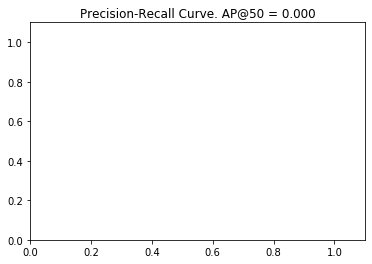

In [19]:
# Draw precision-recall curve
AP, precisions, recalls, gt_match, pred_match, overlaps, pred_match_scores, pred_match_class_ids = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.5)

visualize.plot_precision_recall(AP, precisions, recalls)

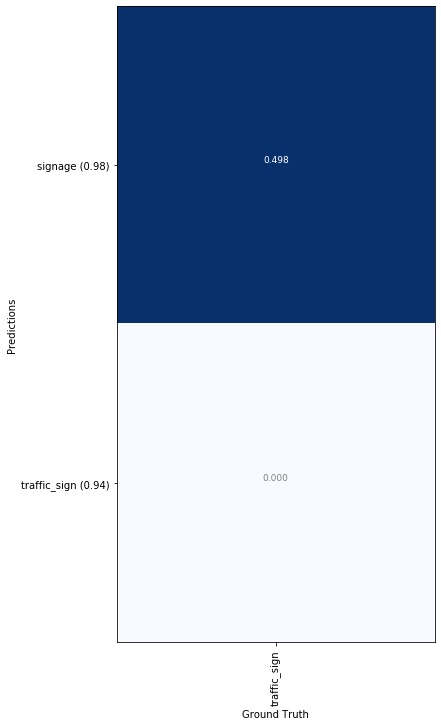

In [20]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

### Compute mAP @ IoU=50 on Batch of Images

In [21]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, datacfg, dnncfg,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, gt_match, pred_match, overlaps, pred_match_scores, pred_match_class_ids =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, 10)
APs = compute_batch_ap(image_ids)
print("mAP @ IoU=50: ", np.mean(APs))

2019-12-23 15:07:29,425:[DEBUG]:[__main__.mrcnn.model]:[model.py:2654 -               detect() ]: results: [{'rois': array([[536,  77, 550,  90]], dtype=int32), 'class_ids': array([3], dtype=int32), 'scores': array([0.99840397], dtype=float32), 'masks': array([[[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       ...,

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]]])}]
2019-12-23 15:07:29,426:[INFO

2019-12-23 15:07:34,870:[INFO]:[__main__.mrcnn.utils]:[utils.py:762 - compute_ap_given_the_matches() ]: precisions: [1. 1. 0.]
2019-12-23 15:07:34,870:[INFO]:[__main__.mrcnn.utils]:[utils.py:763 - compute_ap_given_the_matches() ]: recalls: [0. 1. 1.]
2019-12-23 15:07:34,871:[INFO]:[__main__.mrcnn.utils]:[utils.py:764 - compute_ap_given_the_matches() ]: indices: [1]
2019-12-23 15:07:34,872:[INFO]:[__main__.mrcnn.utils]:[utils.py:766 - compute_ap_given_the_matches() ]: precisions[indices]: [1.]
2019-12-23 15:07:34,872:[INFO]:[__main__.mrcnn.utils]:[utils.py:767 - compute_ap_given_the_matches() ]: recalls[indices:] [1.]
2019-12-23 15:07:34,873:[INFO]:[__main__.mrcnn.utils]:[utils.py:774 - compute_ap_given_the_matches() ]: AP: 1.0
2019-12-23 15:07:37,582:[DEBUG]:[__main__.mrcnn.model]:[model.py:2654 -               detect() ]: results: [{'rois': array([[ 362, 1114,  378, 1128],
       [ 397,  291,  425,  305],
       [ 389,  466,  407,  487]], dtype=int32), 'class_ids': array([3, 1, 1], dt

2019-12-23 15:07:43,329:[INFO]:[__main__.mrcnn.utils]:[utils.py:680 -      compute_matches() ]: sorted pred_scores: [0.99990046 0.9998516  0.9997825  0.9996443  0.99852484 0.9977824
 0.99773574 0.9933942 ]
2019-12-23 15:07:43,340:[INFO]:[__main__.mrcnn.utils]:[utils.py:692 -      compute_matches() ]: sorted pred_scores: [0.99990046 0.9998516  0.9997825  0.9996443  0.99852484 0.9977824
 0.99773574 0.9933942 ]
2019-12-23 15:07:43,341:[INFO]:[__main__.mrcnn.utils]:[utils.py:693 -      compute_matches() ]: len(pred_boxes), pred_boxes.shape: 8, (8, 4)
2019-12-23 15:07:43,342:[INFO]:[__main__.mrcnn.utils]:[utils.py:694 -      compute_matches() ]: len(pred_masks), pred_masks.shape: 1280, (1280, 1280, 8)
2019-12-23 15:07:43,342:[INFO]:[__main__.mrcnn.utils]:[utils.py:695 -      compute_matches() ]: len(gt_boxes), gt_boxes.shape: 14, (14, 4)
2019-12-23 15:07:43,342:[INFO]:[__main__.mrcnn.utils]:[utils.py:696 -      compute_matches() ]: len(gt_masks), gt_masks.shape: 1280, (1280, 1280, 14)
2019-

2019-12-23 15:07:46,310:[INFO]:[__main__.mrcnn.utils]:[utils.py:734 -      compute_matches() ]: STATS: match_count: 0
2019-12-23 15:07:46,311:[INFO]:[__main__.mrcnn.utils]:[utils.py:735 -      compute_matches() ]: gt_match, pred_match, overlaps, pred_match_class_ids: [-1.],[-1.],[[0.]],[]
2019-12-23 15:07:46,312:[INFO]:[__main__.mrcnn.utils]:[utils.py:762 - compute_ap_given_the_matches() ]: precisions: [0. 0. 0.]
2019-12-23 15:07:46,312:[INFO]:[__main__.mrcnn.utils]:[utils.py:763 - compute_ap_given_the_matches() ]: recalls: [0. 0. 1.]
2019-12-23 15:07:46,313:[INFO]:[__main__.mrcnn.utils]:[utils.py:764 - compute_ap_given_the_matches() ]: indices: [2]
2019-12-23 15:07:46,314:[INFO]:[__main__.mrcnn.utils]:[utils.py:766 - compute_ap_given_the_matches() ]: precisions[indices]: [0.]
2019-12-23 15:07:46,314:[INFO]:[__main__.mrcnn.utils]:[utils.py:767 - compute_ap_given_the_matches() ]: recalls[indices:] [1.]
2019-12-23 15:07:46,315:[INFO]:[__main__.mrcnn.utils]:[utils.py:774 - compute_ap_give

2019-12-23 15:07:54,609:[INFO]:[__main__.mrcnn.utils]:[utils.py:680 -      compute_matches() ]: sorted pred_scores: [0.99974734 0.99973434 0.9948192  0.97505873]
2019-12-23 15:07:54,617:[INFO]:[__main__.mrcnn.utils]:[utils.py:692 -      compute_matches() ]: sorted pred_scores: [0.99974734 0.99973434 0.9948192  0.97505873]
2019-12-23 15:07:54,618:[INFO]:[__main__.mrcnn.utils]:[utils.py:693 -      compute_matches() ]: len(pred_boxes), pred_boxes.shape: 4, (4, 4)
2019-12-23 15:07:54,618:[INFO]:[__main__.mrcnn.utils]:[utils.py:694 -      compute_matches() ]: len(pred_masks), pred_masks.shape: 1280, (1280, 1280, 4)
2019-12-23 15:07:54,619:[INFO]:[__main__.mrcnn.utils]:[utils.py:695 -      compute_matches() ]: len(gt_boxes), gt_boxes.shape: 5, (5, 4)
2019-12-23 15:07:54,620:[INFO]:[__main__.mrcnn.utils]:[utils.py:696 -      compute_matches() ]: len(gt_masks), gt_masks.shape: 1280, (1280, 1280, 5)
2019-12-23 15:07:54,621:[INFO]:[__main__.mrcnn.utils]:[utils.py:697 -      compute_matches() ]: 

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [23]:

from mrcnn.model import log

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (409200,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -5.52130  max:    3.20408  float64
positive_anchors         shape: (16, 4)               min:  436.68629  max:  642.62742  float64
negative_anchors         shape: (240, 4)              min: -149.01934  max: 1354.50967  float64
neutral anchors          shape: (408944, 4)           min: -362.03867  max: 1578.03867  float64
refined_anchors          shape: (16, 4)               min:  441.00000  max:  614.00000  float32


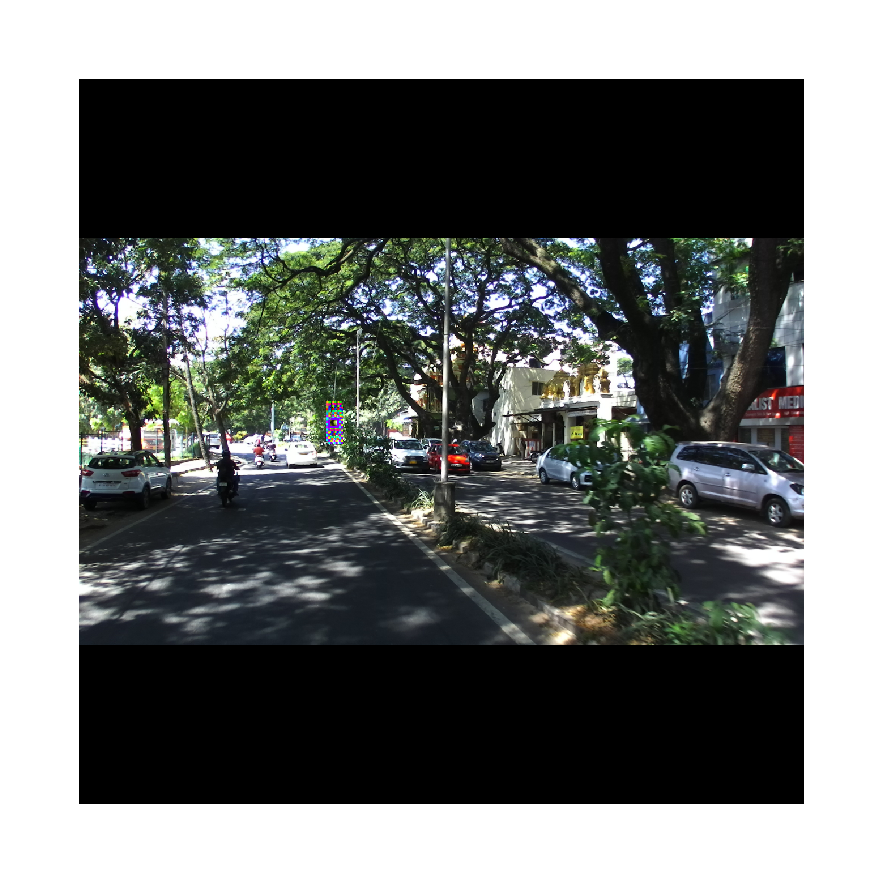

In [24]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [25]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 409200, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.28306  max:    1.23302  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.60024  max:    1.41791  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 2055.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


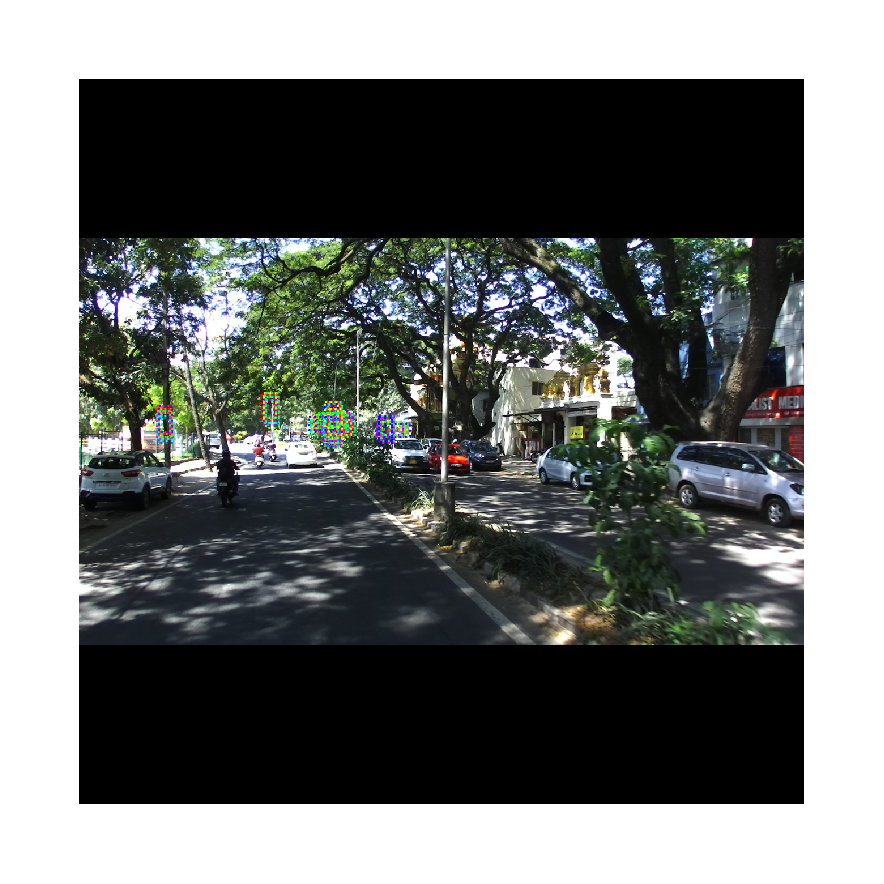

In [26]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

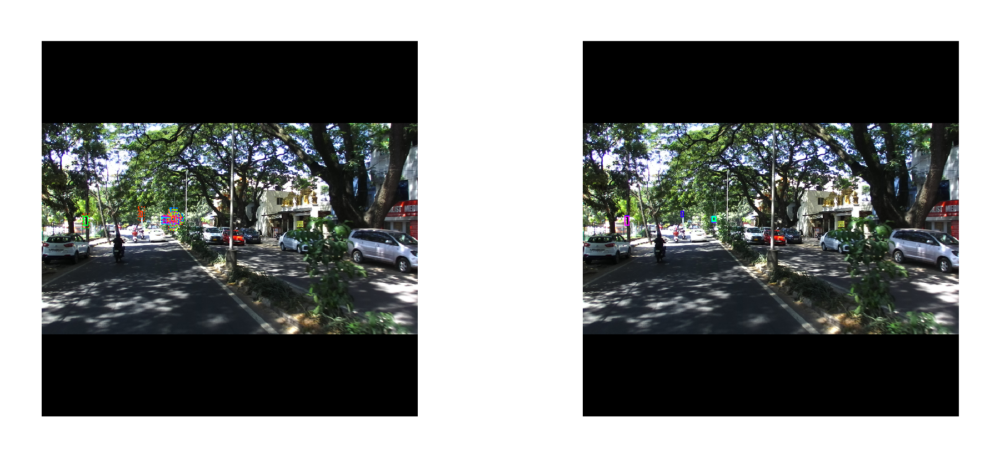

In [27]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

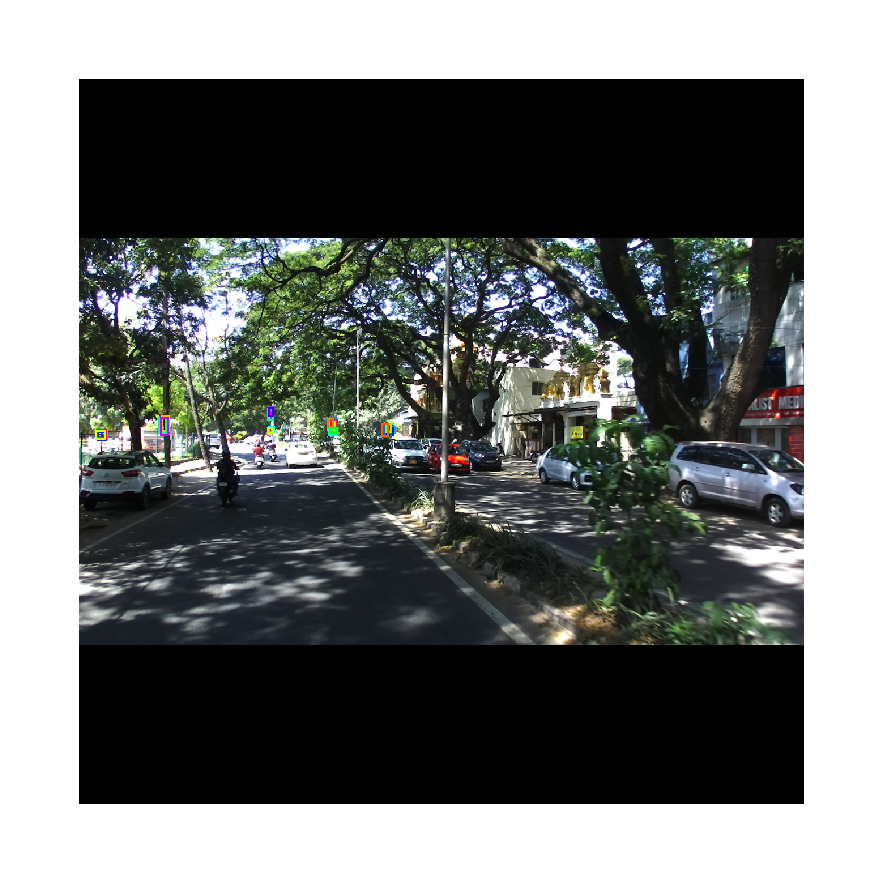

In [28]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

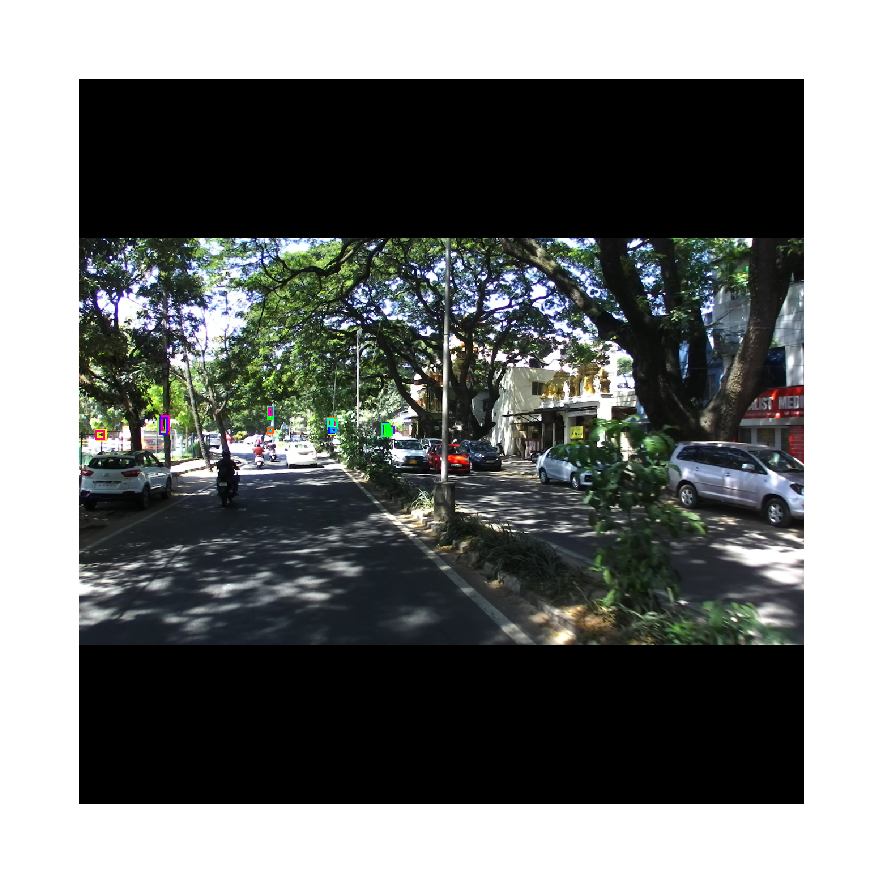

In [30]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = dnncfg.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [31]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


2019-12-23 15:09:23,376:[INFO]:[__main__.mrcnn.utils]:[utils.py:859 -       compute_recall() ]: Bbox IoU before filtering with threshold: overlaps: [[0. 0. 0. ... 0. 0. 0.]]
2019-12-23 15:09:23,378:[INFO]:[__main__.mrcnn.utils]:[utils.py:863 -       compute_recall() ]: iou_argmax: [142416]
2019-12-23 15:09:23,378:[INFO]:[__main__.mrcnn.utils]:[utils.py:869 -       compute_recall() ]: Total matched gt_boxes (0.0)/Total gt_boxes(0) = recall(409200)
All Anchors (409200)       Recall: 0.000  Positive anchors: 0
2019-12-23 15:09:23,477:[INFO]:[__main__.mrcnn.utils]:[utils.py:859 -       compute_recall() ]: Bbox IoU before filtering with threshold: overlaps: [[0. 0. 0. ... 0. 0. 0.]]
2019-12-23 15:09:23,477:[INFO]:[__main__.mrcnn.utils]:[utils.py:863 -       compute_recall() ]: iou_argmax: [0]
2019-12-23 15:09:23,478:[INFO]:[__main__.mrcnn.utils]:[utils.py:869 -       compute_recall() ]: Total matched gt_boxes (0.0)/Total gt_boxes(0) = recall(6000)
Refined Anchors ( 6000)   Recall: 0.000  Po

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [32]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 4, 4)       min:   -3.82826  max:    4.13033  float32
masks                    shape: (1, 100, 28, 28, 4)   min:    0.00218  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    3.00000  float32


2 detections: ['signage' 'traffic_sign']


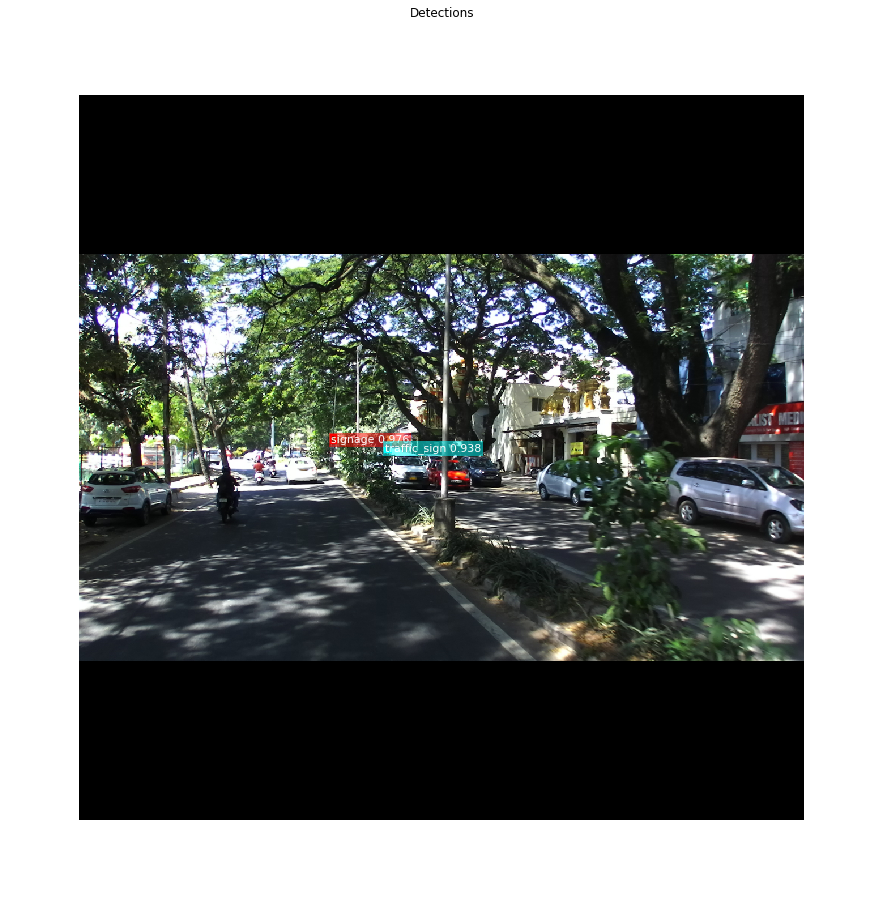

In [33]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [36]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = dnncfg.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
28 Positive ROIs
[('BG', 972), ('signage', 13), ('traffic_light', 2), ('traffic_sign', 13)]


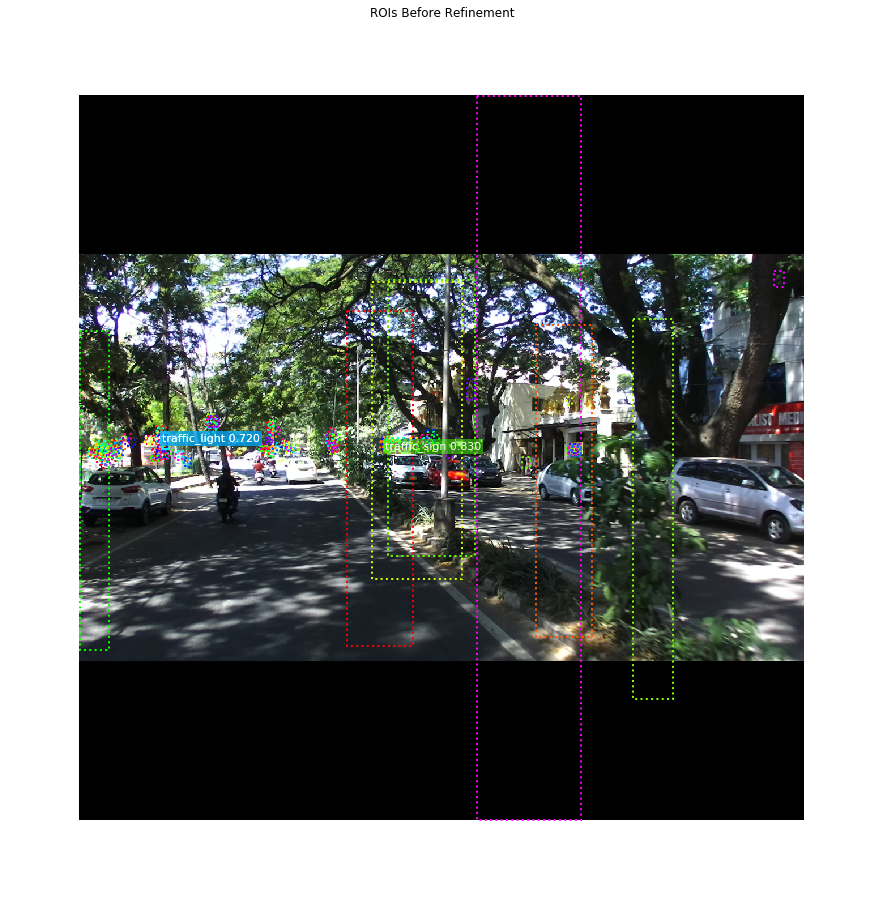

In [37]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -3.16638  max:    2.49175  float32
refined_proposals        shape: (1000, 4)             min: -375.00000  max: 1388.00000  int32


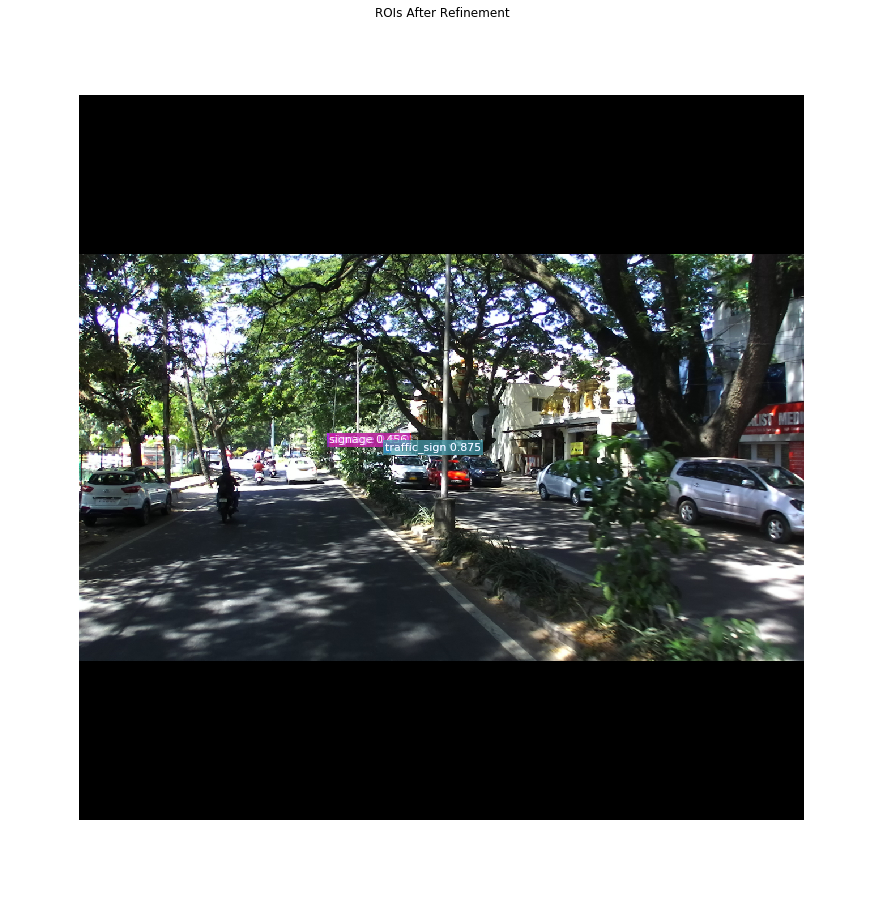

In [39]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * dnncfg.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [40]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 28 detections:
[  0   1   2   3   4   6   7  10  11  12  15  17  23  24  27  36  41  52
  77 100 106 113 134 199 233 326 380 920]


In [43]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= dnncfg.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    dnncfg.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 8:
[  0   1   2  27  36  52 106 233]


#### Per-Class Non-Max Suppression

In [45]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            dnncfg.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

signage               : [  0   1   2  52 233] -> [1]
traffic_sign          : [ 27  36 106] -> [106]

Kept after per-class NMS: 2
[  1 106]


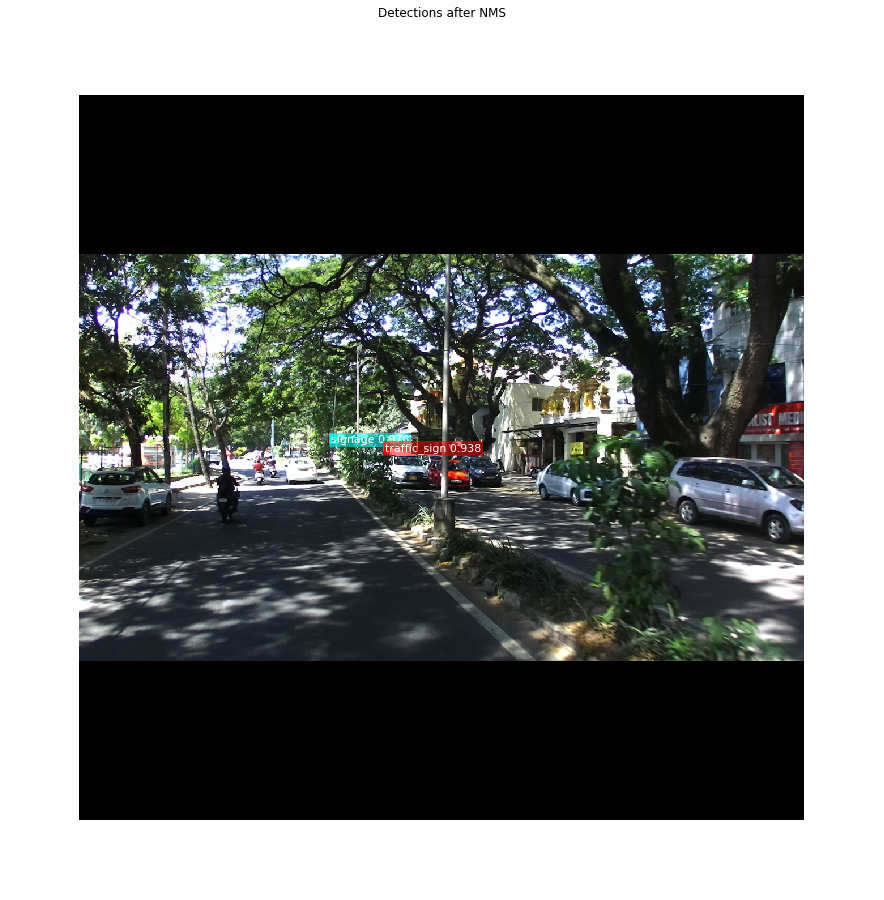

In [46]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

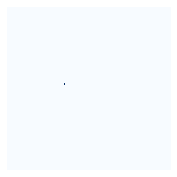

In [47]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [48]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    3.00000  float32
masks                    shape: (1, 100, 28, 28, 4)   min:    0.00218  max:    1.00000  float32
2 detections: ['signage' 'traffic_sign']


In [49]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (2, 28, 28)           min:    0.01228  max:    1.00000  float32
det_masks                shape: (2, 1280, 1280)       min:    0.00000  max:    1.00000  bool


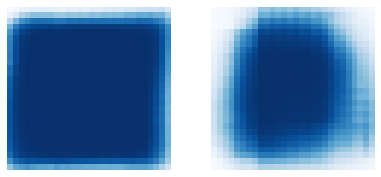

In [50]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

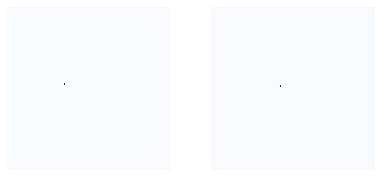

In [51]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [52]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1280, 1280, 3)    min: -123.70000  max:  151.10001  float32
res4w_out                shape: (1, 80, 80, 1024)     min:    0.00000  max:   56.85904  float32
rpn_bbox                 shape: (1, 409200, 4)        min:  -13.31207  max:   34.53761  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


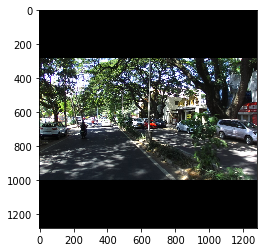

In [54]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],dnncfg))

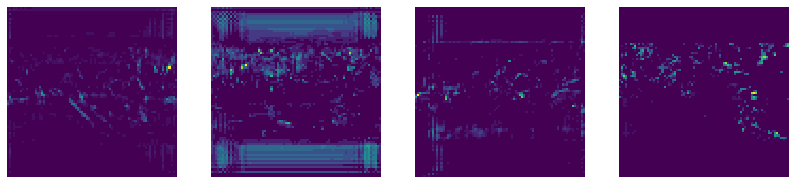

In [55]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,:4], [2, 0, 1]))

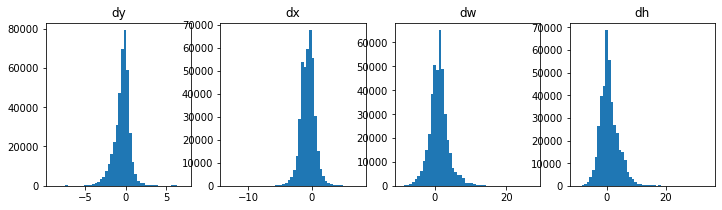

In [56]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

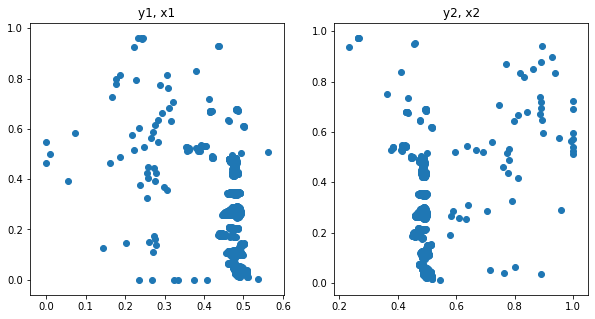

In [57]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()